<a href="https://colab.research.google.com/github/kurek0010/neural-network-course/blob/master/06_cnn/01_image_preprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Image Preprocessing - przygotowanie obrazów

**Augmentacja danych** - technika pozwalająca na zwiększenie zbioru treningowego przez odpowiednie przekształcenia danych wejsciowych. Technika bardzo przydtna zwłaszcza gdy nie mamy wystarczającej ilości danych do wytrenowania sieci. W uczeniu głębokim im więcej posiadamy danych treningowych tym teoretycznie lepiej jesteśmy w stanie wytrenować sieć. Wykorzystamy tą technikę do trenowania problemów związanych z przetwarzaniem obrazu.

Biblioteka Keras dostarcza narzędzia do augmentacji danych, które działają automatycznie podczas trenowania sieci. Możemy to zrobić dzięki klasie **ImageDataGenerator**.

In [1]:
# %tensorflow_version 2.x
import matplotlib.pyplot as plt
from numpy import expand_dims

from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator

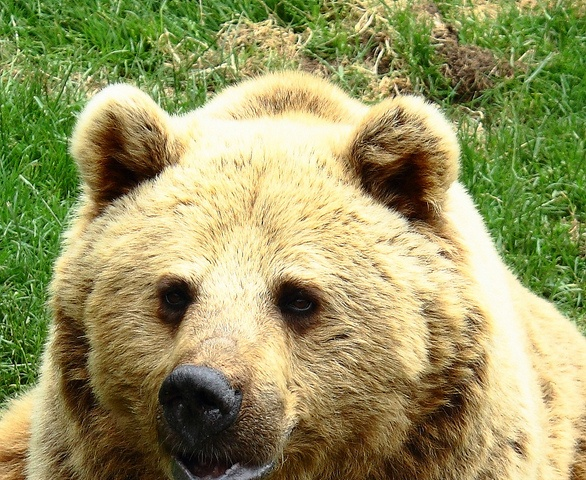

In [9]:
img = load_img('dog.jpg')
img

In [10]:
data = img_to_array(img)
data.shape

(480, 586, 3)

In [11]:
data

array([[[ 84., 137.,  55.],
        [ 61., 115.,  31.],
        [ 50., 105.,  21.],
        ...,
        [182., 175., 105.],
        [189., 180., 111.],
        [183., 174., 105.]],

       [[105., 156.,  77.],
        [117., 169.,  87.],
        [ 68., 122.,  38.],
        ...,
        [206., 199., 129.],
        [194., 187., 117.],
        [195., 188., 118.]],

       [[ 56., 102.,  27.],
        [114., 161.,  83.],
        [139., 188., 109.],
        ...,
        [172., 168.,  97.],
        [178., 175., 106.],
        [195., 192., 123.]],

       ...,

       [[190., 150.,  98.],
        [187., 147.,  95.],
        [195., 156., 101.],
        ...,
        [188., 145.,  77.],
        [197., 154.,  86.],
        [194., 151.,  83.]],

       [[192., 151.,  99.],
        [217., 176., 124.],
        [227., 188., 133.],
        ...,
        [158., 113.,  48.],
        [165., 120.,  55.],
        [172., 127.,  62.]],

       [[203., 162., 110.],
        [202., 161., 109.],
        [207., 1

In [12]:
data[:, :, 0]

array([[ 84.,  61.,  50., ..., 182., 189., 183.],
       [105., 117.,  68., ..., 206., 194., 195.],
       [ 56., 114., 139., ..., 172., 178., 195.],
       ...,
       [190., 187., 195., ..., 188., 197., 194.],
       [192., 217., 227., ..., 158., 165., 172.],
       [203., 202., 207., ..., 125., 147., 155.]], dtype=float32)

In [13]:
data[:, :, 1]

array([[137., 115., 105., ..., 175., 180., 174.],
       [156., 169., 122., ..., 199., 187., 188.],
       [102., 161., 188., ..., 168., 175., 192.],
       ...,
       [150., 147., 156., ..., 145., 154., 151.],
       [151., 176., 188., ..., 113., 120., 127.],
       [162., 161., 168., ...,  77., 102., 110.]], dtype=float32)

In [30]:
data[:, :, 2]

array([[ 55.,  31.,  21., ..., 105., 111., 105.],
       [ 77.,  87.,  38., ..., 129., 117., 118.],
       [ 27.,  83., 109., ...,  97., 106., 123.],
       ...,
       [ 98.,  95., 101., ...,  77.,  86.,  83.],
       [ 99., 124., 133., ...,  48.,  55.,  62.],
       [110., 109., 113., ...,  13.,  37.,  45.]], dtype=float32)

In [15]:
samples = expand_dims(data, 0)
samples

array([[[[ 84., 137.,  55.],
         [ 61., 115.,  31.],
         [ 50., 105.,  21.],
         ...,
         [182., 175., 105.],
         [189., 180., 111.],
         [183., 174., 105.]],

        [[105., 156.,  77.],
         [117., 169.,  87.],
         [ 68., 122.,  38.],
         ...,
         [206., 199., 129.],
         [194., 187., 117.],
         [195., 188., 118.]],

        [[ 56., 102.,  27.],
         [114., 161.,  83.],
         [139., 188., 109.],
         ...,
         [172., 168.,  97.],
         [178., 175., 106.],
         [195., 192., 123.]],

        ...,

        [[190., 150.,  98.],
         [187., 147.,  95.],
         [195., 156., 101.],
         ...,
         [188., 145.,  77.],
         [197., 154.,  86.],
         [194., 151.,  83.]],

        [[192., 151.,  99.],
         [217., 176., 124.],
         [227., 188., 133.],
         ...,
         [158., 113.,  48.],
         [165., 120.,  55.],
         [172., 127.,  62.]],

        [[203., 162., 110.],
       

In [16]:
samples.shape

(1, 480, 586, 3)

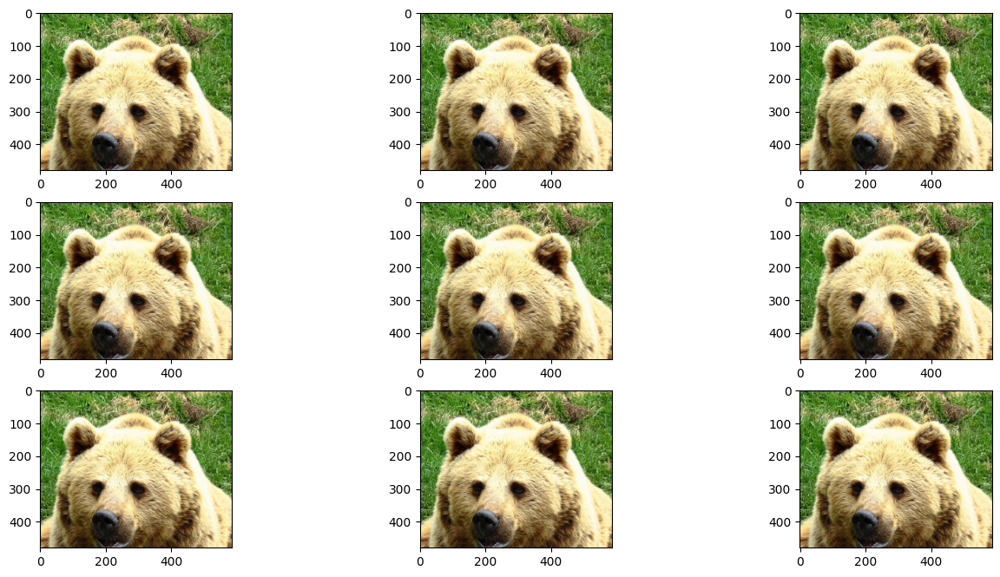

In [18]:
datagen = ImageDataGenerator()

iterator = datagen.flow(samples, batch_size=1)

plt.figure(figsize=(16, 8))
for i in range(9):
    plt.subplot(330 + i + 1)
    batch = next(iterator)
    image = batch[0].astype('uint8')
    plt.imshow(image)
plt.show()

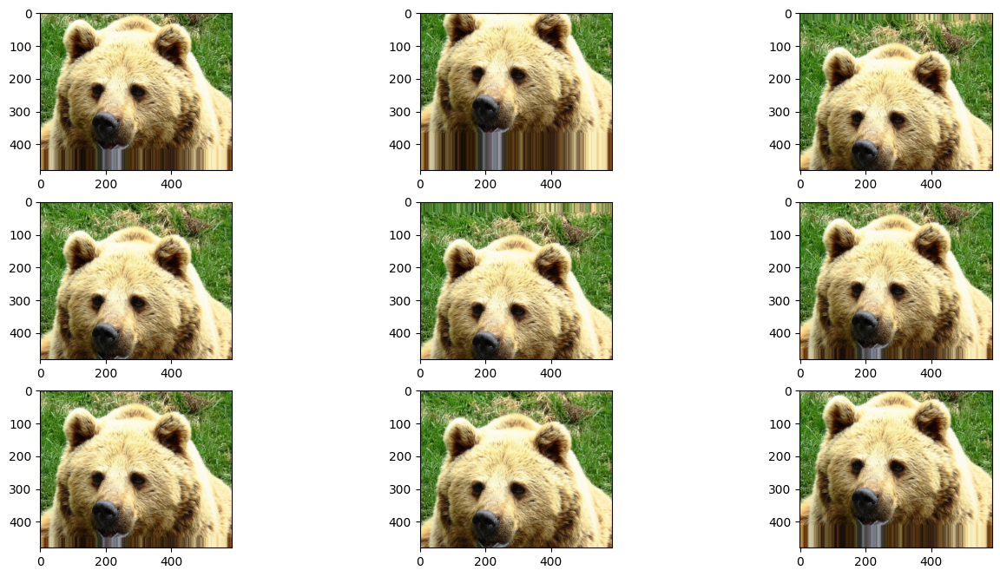

In [31]:
datagen = ImageDataGenerator(width_shift_range=0.3)

iterator = datagen.flow(samples, batch_size=1)

plt.figure(figsize=(16, 8))
for i in range(9):
    plt.subplot(330 + i + 1)
    batch = next(iterator)
    image = batch[0].astype('uint8')
    plt.imshow(image)
plt.show()

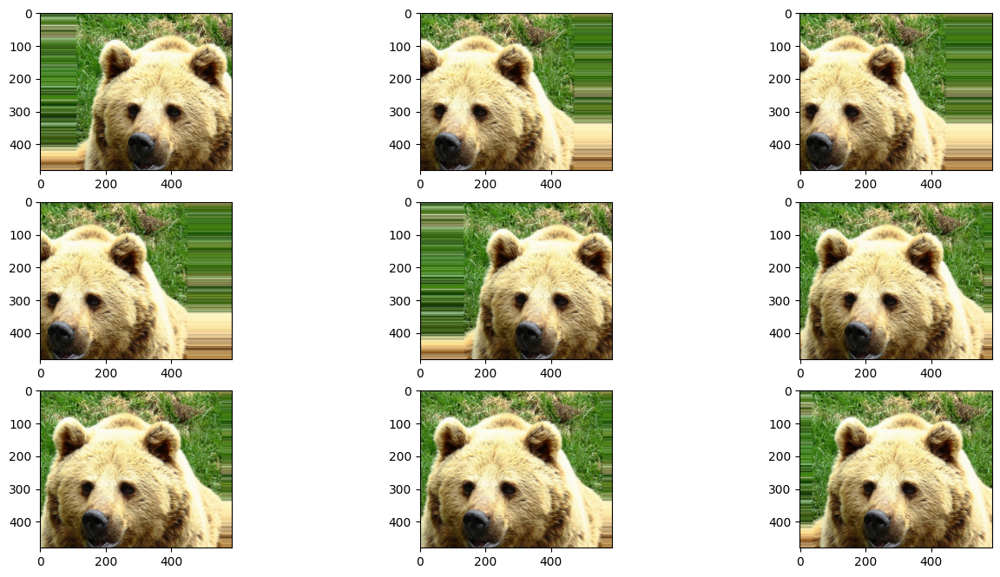

In [32]:
datagen = ImageDataGenerator(height_shift_range=0.3)

iterator = datagen.flow(samples, batch_size=1)

plt.figure(figsize=(16, 8))
for i in range(9):
    plt.subplot(330 + i + 1)
    batch = next(iterator)
    image = batch[0].astype('uint8')
    plt.imshow(image)
plt.show()

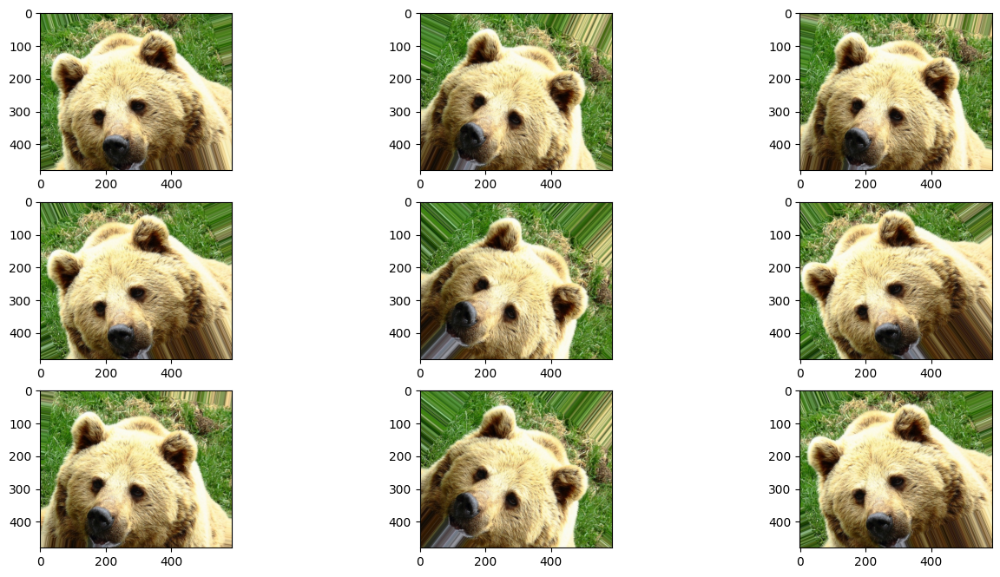

In [22]:
datagen = ImageDataGenerator(rotation_range=45)

iterator = datagen.flow(samples, batch_size=1)

plt.figure(figsize=(16, 8))
for i in range(9):
    plt.subplot(330 + i + 1)
    batch = next(iterator)
    image = batch[0].astype('uint8')
    plt.imshow(image)
plt.show()

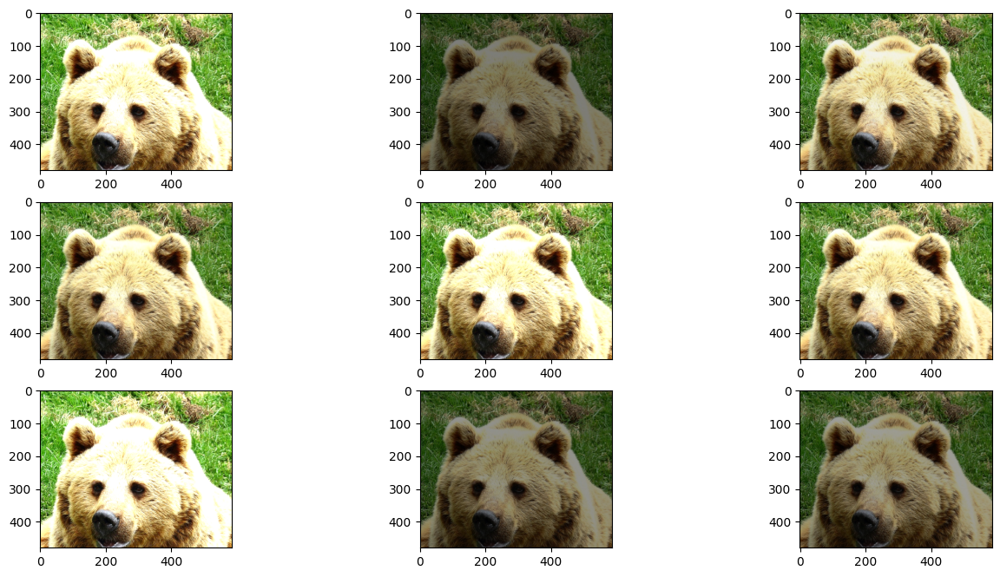

In [23]:
datagen = ImageDataGenerator(brightness_range=[0.4, 1.5])

iterator = datagen.flow(samples, batch_size=1)

plt.figure(figsize=(16, 8))
for i in range(9):
    plt.subplot(330 + i + 1)
    batch = next(iterator)
    image = batch[0].astype('uint8')
    plt.imshow(image)
plt.show()

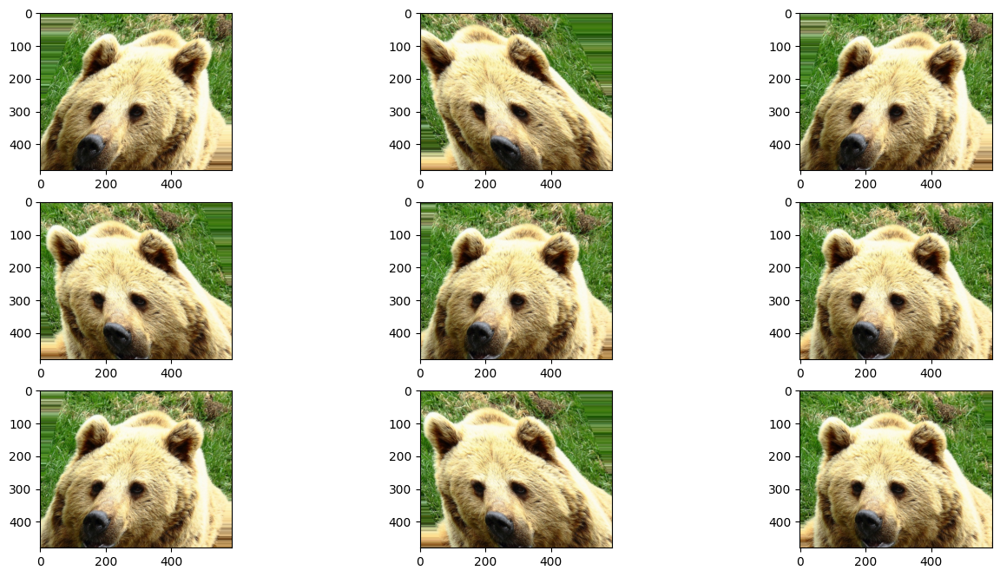

In [24]:
datagen = ImageDataGenerator(shear_range=30)

iterator = datagen.flow(samples, batch_size=1)

plt.figure(figsize=(16, 8))
for i in range(9):
    plt.subplot(330 + i + 1)
    batch = next(iterator)
    image = batch[0].astype('uint8')
    plt.imshow(image)
plt.show()

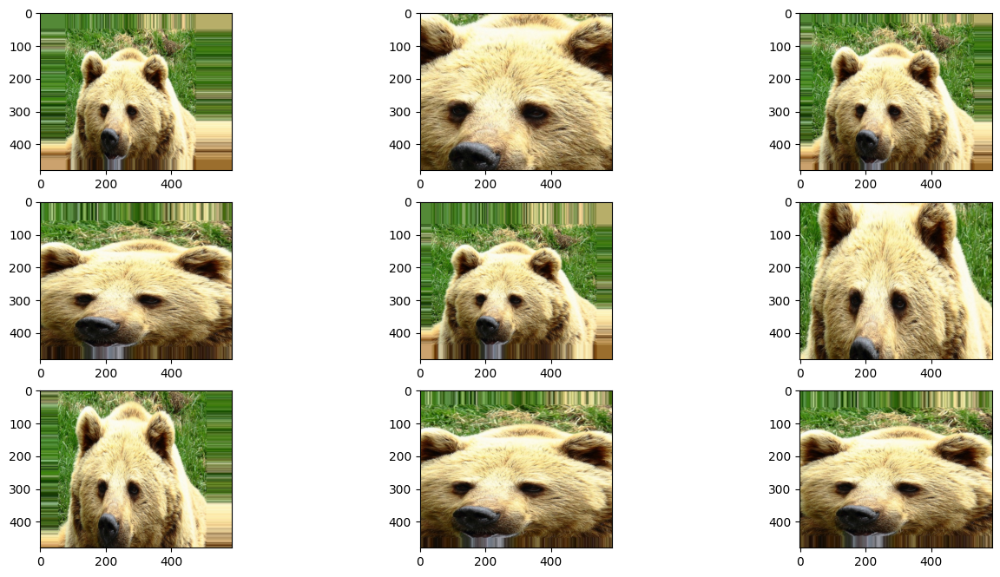

In [25]:
datagen = ImageDataGenerator(zoom_range=0.5)

iterator = datagen.flow(samples, batch_size=1)

plt.figure(figsize=(16, 8))
for i in range(9):
    plt.subplot(330 + i + 1)
    batch = next(iterator)
    image = batch[0].astype('uint8')
    plt.imshow(image)
plt.show()

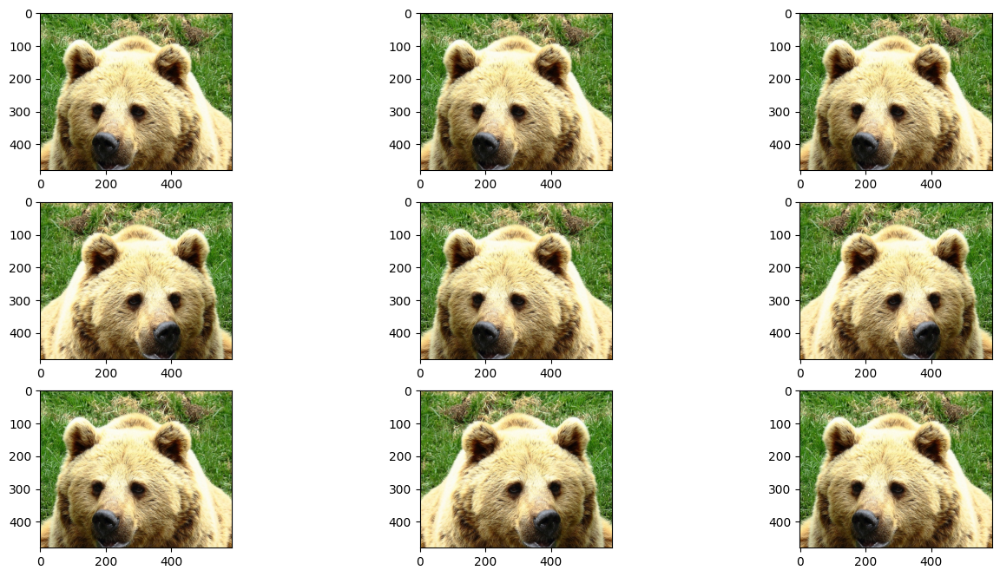

In [26]:
datagen = ImageDataGenerator(horizontal_flip=True)

iterator = datagen.flow(samples, batch_size=1)

plt.figure(figsize=(16, 8))
for i in range(9):
    plt.subplot(330 + i + 1)
    batch = next(iterator)
    image = batch[0].astype('uint8')
    plt.imshow(image)
plt.show()

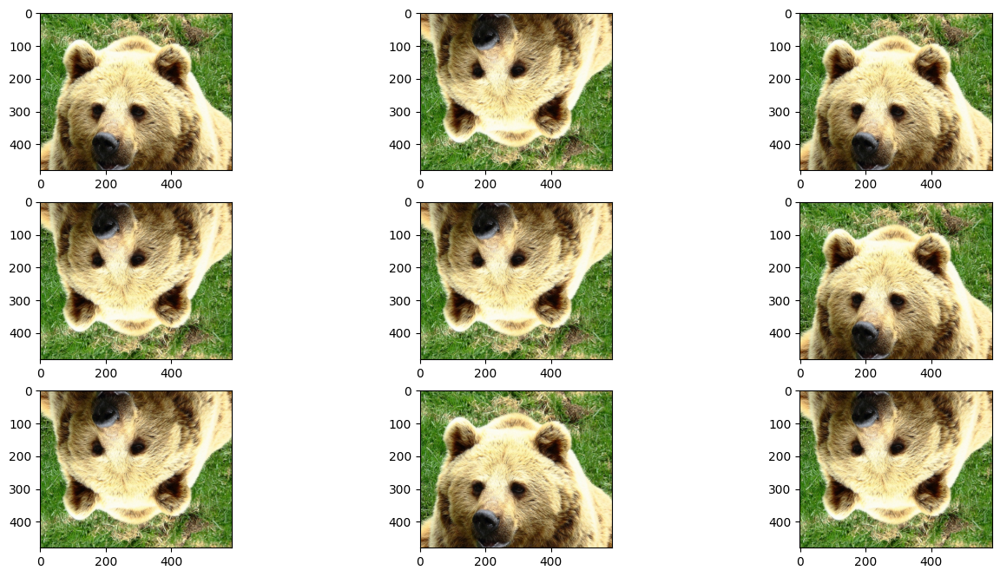

In [27]:
datagen = ImageDataGenerator(vertical_flip=True)

iterator = datagen.flow(samples, batch_size=1)

plt.figure(figsize=(16, 8))
for i in range(9):
    plt.subplot(330 + i + 1)
    batch = next(iterator)
    image = batch[0].astype('uint8')
    plt.imshow(image)
plt.show()

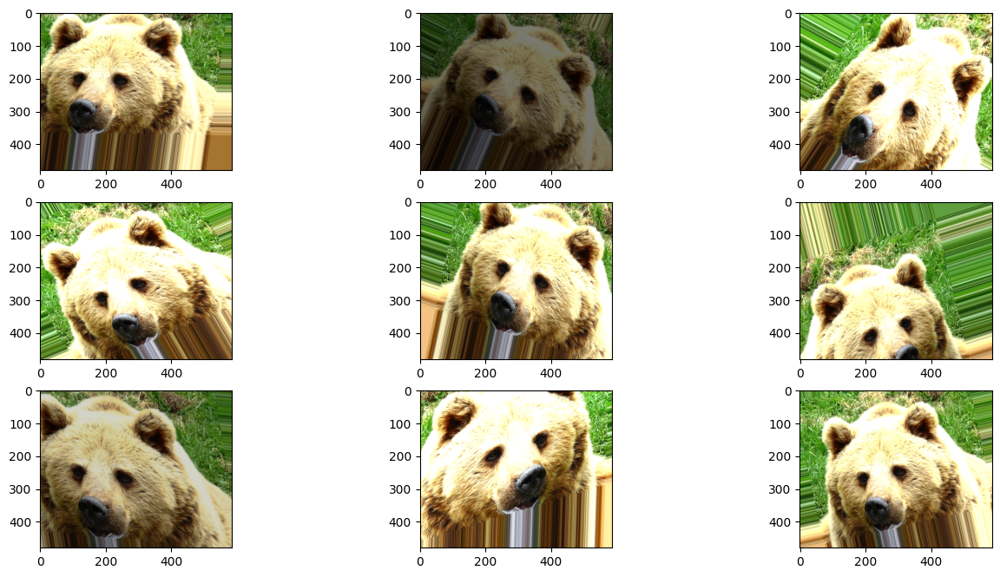

In [28]:
datagen = ImageDataGenerator(width_shift_range=0.2,
                             height_shift_range=0.2,
                             rotation_range=30,
                             brightness_range=[0.4, 1.5],
                             shear_range=20,
                             zoom_range=0.1,
                             horizontal_flip=True)

iterator = datagen.flow(samples, batch_size=1)

plt.figure(figsize=(16, 8))
for i in range(9):
    plt.subplot(330 + i + 1)
    batch = next(iterator)
    image = batch[0].astype('uint8')
    plt.imshow(image)
plt.show()